In [1]:
import torch
import numpy as np
import einops
from tqdm import tqdm
import os
from transformers import ViTImageProcessor, ViTForImageClassification
from datasets import load_dataset
import pickle
import matplotlib.pyplot as plt

external_path=''

In [2]:
class AutoEncoder(torch.nn.Module):
    def __init__(self, activation_size, n_dict_components, t_type=torch.float32, l1_coef=0.0):
        super(AutoEncoder, self).__init__()
        
        self.decoder = torch.nn.Linear(n_dict_components, activation_size, bias=True)
        self.encoder_bias= torch.nn.Parameter(torch.zeros(n_dict_components))

        torch.nn.init.orthogonal_(self.decoder.weight)
        self.decoder = self.decoder.to(t_type)

        self.encoder = torch.nn.Sequential(torch.nn.ReLU()).to(t_type)

        self.l1_coef = l1_coef
        self.activation_size = activation_size
        self.n_dict_components = n_dict_components

    def forward(self, x):
        c = self.encoder(x @ self.decoder.weight + self.encoder_bias)
        self.decoder.weight.data = torch.nn.functional.normalize(self.decoder.weight.data, dim=0)

        x_hat = self.decoder(c)
        return x_hat, c
    
def AutoEncoderLoss(inputs,target,alpha=1e-3):
    return torch.norm(target-inputs[0],p=2,dim=1).pow(2)+alpha*torch.norm(inputs[1],p=1,dim=1)

In [3]:
def sae_feature_extraction(layer,categories,expansion_factor=8,epochs=20,batch_size=128,lr=1e-3,alpha=1e-3,verbose=True):
    for n,category in enumerate(categories):
        for k in range(1,11):
            if n==0 and k==1:
                activations=torch.load(f'{external_path}\\class_token_activations\\{category}\\layer{layer}_{k}.pt').squeeze(1)
            else:
                activations=torch.cat([activations,torch.load(f'{external_path}\\class_token_activations\\{category}\\layer{layer}_{k}.pt').squeeze(1)])
    activations=activations.detach()
    activation_dim=activations.shape[-1]
    dataset_size=activations.shape[0]
    sae=AutoEncoder(activation_dim,activation_dim*expansion_factor)
    optimizer=torch.optim.Adam(sae.parameters(),lr=lr)
    if verbose:
        progress_bar=tqdm(range(epochs))
    else:
        progress_bar=range(epochs)
    for epoch in progress_bar:
        #perm=torch.randperm(dataset_size)
        #epoch_dataset=activations[perm,:]
        epoch_cycles=dataset_size//batch_size
        epoch_loss=0
        for k in range(epoch_cycles+1):
            if k==epoch_cycles:
                optimizer.zero_grad()
                #inputs=epoch_dataset[dataset_size-k*batch_size:,:]
                inputs=activations[dataset_size-k*batch_size:,:]
                outputs=sae(inputs)
                loss=AutoEncoderLoss(outputs,inputs,alpha).mean()
                loss.backward()
                optimizer.step()
                epoch_loss+=loss*(dataset_size-k*batch_size)
            else:
                optimizer.zero_grad()
                #inputs=epoch_dataset[k*batch_size:(k+1)*batch_size,:]
                inputs=activations[k*batch_size:(k+1)*batch_size,:]
                outputs=sae(inputs)
                loss=AutoEncoderLoss(outputs,inputs,alpha).mean()
                loss.backward()
                optimizer.step()
                epoch_loss+=loss*batch_size
        epoch_loss=epoch_loss/dataset_size
        if verbose:
            progress_bar.set_description(f'Epoch {epoch+1}/{epochs}, loss={epoch_loss:.4f}')
    return sae.encoder_bias.detach(),sae.decoder.weight.detach().T,sae.decoder.bias.detach(),loss

In [17]:
configuration_num=16

expansion_factor=2
epochs=50
batch_size=128
lr=1e-3
alpha=1e-3

categories=os.listdir(f'{external_path}\\class_token_activations')

layers_to_consider=[3,11]

if not(os.path.exists(f'{external_path}\\sparse_autoencoder_extraction\\configuration_{configuration_num}')):
    os.mkdir(f'{external_path}\\sparse_autoencoder_extraction\\configuration_{configuration_num}')

configuration_file=open(f'{external_path}\\sparse_autoencoder_extraction\\configuration_{configuration_num}\\configuration_details.txt','w')
configuration_file.write(f'expansion_factor={expansion_factor}\nepochs={epochs}\nbatch_size={batch_size}\nlr={lr}\nalpha={alpha}\ncategories={categories}')
configuration_file.close()

losses={}

progress_bar=tqdm(range(13))
for layer in progress_bar:
    if not(layer in layers_to_consider):
        continue
    progress_bar.set_description(f'...getting features for layer {layer}...')
    encoder_bias,decoder_weight,decoder_bias,loss=sae_feature_extraction(layer,categories,expansion_factor,epochs,batch_size,lr,alpha,verbose=False)
    torch.save(encoder_bias,f'{external_path}\\sparse_autoencoder_extraction\\configuration_{configuration_num}\\layer{layer}_encoderbias.pt')
    torch.save(decoder_weight,f'{external_path}\\sparse_autoencoder_extraction\\configuration_{configuration_num}\\layer{layer}_features.pt')
    torch.save(decoder_bias,f'{external_path}\\sparse_autoencoder_extraction\\configuration_{configuration_num}\\layer{layer}_bias.pt')
    losses[layer]=loss.item()

losses_file=open(f'{external_path}\\sparse_autoencoder_extraction\\configuration_{configuration_num}\\losses','wb')
pickle.dump(losses,losses_file)
losses_file.close()

...getting features for layer 11...:   0%|          | 0/13 [04:06<?, ?it/s]

In [4]:
processor = ViTImageProcessor.from_pretrained('google/vit-base-patch16-224')
model = ViTForImageClassification.from_pretrained('aaraki/vit-base-patch16-224-in21k-finetuned-cifar10')

In [5]:
dataset = load_dataset("uoft-cs/cifar10")

train_set = dataset["train"]
test_set = dataset["test"]

In [6]:
def feature_decompositions(configuration_num,test_set,model,processor):
    if not(os.path.exists(f'{external_path}\\sparse_autoencoder_extraction\\configuration_{configuration_num}\\feature_decomposition')):
            os.mkdir(f'{external_path}\\sparse_autoencoder_extraction\\configuration_{configuration_num}\\feature_decomposition')
    progress_bar=tqdm(range(13))
    for layer in progress_bar:
        if not(layer in layers_to_consider):
            continue
        encoder_bias=torch.load(f'{external_path}\\sparse_autoencoder_extraction\\configuration_{configuration_num}\\layer{layer}_encoderbias.pt')
        features=torch.load(f'{external_path}\\sparse_autoencoder_extraction\\configuration_{configuration_num}\\layer{layer}_features.pt')
        bias=torch.load(f'{external_path}\\sparse_autoencoder_extraction\\configuration_{configuration_num}\\layer{layer}_bias.pt')

        activation_dim=768
        sae=AutoEncoder(activation_dim,activation_dim*expansion_factor)
        with torch.no_grad():
            sae.encoder_bias=torch.nn.Parameter(encoder_bias)
            sae.decoder.weight=torch.nn.Parameter(features.T)
            sae.decoder.bias=torch.nn.Parameter(bias)

        if not(os.path.exists(f'{external_path}\\sparse_autoencoder_extraction\\configuration_{configuration_num}\\feature_decomposition\\{layer}')):
            os.mkdir(f'{external_path}\\sparse_autoencoder_extraction\\configuration_{configuration_num}\\feature_decomposition\\{layer}')
        sampled_imgs_idx=[]
        first_instance=True
        num_instances=0
        block=1
        for n,test_instance in enumerate(test_set):
            progress_bar.set_description(f'...processing layer {layer}, block {block}/10...')
            image=np.array(test_instance['img'])
            model_input = processor(images=image, return_tensors="pt")
            model_output = model(**model_input,output_hidden_states=True)
            predicted_category=model_output.logits.argmax(-1).item()
            if predicted_category==test_instance['label']:
                sampled_imgs_idx.append(n)
                if first_instance:
                    feat_decomp=sae.encoder(model_output.hidden_states[layer][0,-1,:] @ sae.decoder.weight + sae.encoder_bias).unsqueeze(0)
                    first_instance=False
                else:
                    decomp=sae.encoder(model_output.hidden_states[layer][0,-1,:] @ sae.decoder.weight + sae.encoder_bias).unsqueeze(0)
                    feat_decomp=torch.cat([feat_decomp,decomp])
                num_instances+=1
                if num_instances==100:
                    first_instance=True
                    num_instances=0
                    torch.save(feat_decomp,f'{external_path}\\sparse_autoencoder_extraction\\configuration_{configuration_num}\\feature_decomposition\\{layer}\\feature_decomposition_{block}.pt')
                    block+=1
            if block==6:
                break
        sampled_imgs_idx=np.array(sampled_imgs_idx)
        np.save(f'{external_path}\\sparse_autoencoder_extraction\\configuration_{configuration_num}\\feature_decomposition\\{layer}\\sampled_imgs_idx.npy',sampled_imgs_idx)

In [9]:
feature_decompositions(configuration_num,test_set,model,processor)

...processing layer 11, block 5/10...: 100%|██████████| 13/13 [13:14<00:00, 61.10s/it]


In [10]:
def configuration_loss_plot(configuration_num):
    losses_file=open(f'{external_path}\\sparse_autoencoder_extraction\\configuration_{configuration_num}\\losses','rb')
    losses=pickle.load(losses_file)
    losses_file.close()
    fig,ax=plt.subplots(nrows=1,ncols=1)
    ax.plot(losses.keys(),losses.values())
    ax.set_xlabel('Layer')
    ax.set_ylabel('Loss')
    plt.savefig(f'features/configuration_{configuration_num}/losses.png')

In [11]:
def feature_sparsity_plot(configuration_num,layer,firing_threshold=0.1):
    first_file=True
    for file in os.listdir(f'{external_path}\\sparse_autoencoder_extraction\\configuration_{configuration_num}\\feature_decomposition\\{layer}'):
        if '.npy' in file:
            continue
        if first_file:
            feat_decomp=torch.load(f'{external_path}\\sparse_autoencoder_extraction\\configuration_{configuration_num}\\feature_decomposition\\{layer}\\{file}')
            first_file=False
        else:
            decomp=torch.load(f'{external_path}\\sparse_autoencoder_extraction\\configuration_{configuration_num}\\feature_decomposition\\{layer}\\{file}')
            feat_decomp=torch.cat([feat_decomp,decomp])
    num_images=feat_decomp.shape[0]
    sparsities=[]
    for k in range(feat_decomp.shape[-1]):
        feat_firings=feat_decomp[:,k]
        sparsity=torch.sum((feat_firings>firing_threshold)).item()/num_images
        sparsities.append(sparsity)
    fig,ax=plt.subplots(nrows=1,ncols=1)
    ax.hist(sparsities,bins=[0]+[5e-4]+[k*10**(-3) for k in range(1,10)]+[k*10**(-2) for k in range(1,10)]+[k*10**(-1) for k in range(1,10)])
    ax.set_xscale('log')
    plt.savefig(f'features/configuration_{configuration_num}/layer{layer}/sparsity_plot.png')

In [12]:
def frequently_max_firing(configuration_num,layer,test_set,num_feats_identify=8,num_images=6):
    first_file=True
    for file in os.listdir(f'{external_path}\\sparse_autoencoder_extraction\\configuration_{configuration_num}\\feature_decomposition\\{layer}'):
        if '.npy' in file:
            continue
        if first_file:
            feat_decomp=torch.load(f'{external_path}\\sparse_autoencoder_extraction\\configuration_{configuration_num}\\feature_decomposition\\{layer}\\{file}')
            first_file=False
        else:
            decomp=torch.load(f'{external_path}\\sparse_autoencoder_extraction\\configuration_{configuration_num}\\feature_decomposition\\{layer}\\{file}')
            feat_decomp=torch.cat([feat_decomp,decomp])

    sampled_imgs_idx=np.load(f'{external_path}\\sparse_autoencoder_extraction\\configuration_{configuration_num}\\feature_decomposition\\{layer}\\sampled_imgs_idx.npy')

    for k in range(feat_decomp.shape[0]):
        feat_decomp[k,:]=feat_decomp[k,:]/torch.norm(feat_decomp[k,:],p=2)

    counts=np.zeros(feat_decomp.shape[-1])
    for k in range(feat_decomp.shape[0]):
        max_idx=torch.argsort(feat_decomp[k,:],descending=True)[0]
        counts[max_idx]+=1
    feats_to_sample=np.argsort(counts)[-num_feats_identify:]



    sample_feats_decomp=feat_decomp[:,feats_to_sample]
    activating_images=[]
    for k in range(num_feats_identify):
        feature_decompositions=sample_feats_decomp[:,k]
        activating_images.append(sampled_imgs_idx[torch.argsort(feature_decompositions,descending=True)[:num_images]])

    fig,axs=plt.subplots(nrows=num_feats_identify,ncols=num_images)
    fig.set_figheight(num_feats_identify)
    fig.set_figwidth(num_images)
    fig.suptitle('Frequently Max Firing Features', fontsize=16)

    for n in range(num_feats_identify):
        for m,test_instance in enumerate(test_set):
            if m in activating_images[n]:
                idx=(activating_images[n]==m).nonzero()[0][0]
                axs[n][idx].imshow(np.array(test_instance['img']),aspect='auto')
                if idx==0:
                    axs[n][idx].set_ylabel(str(feats_to_sample[n].item()))
                axs[n][idx].xaxis.set_visible(False)
                axs[n][idx].tick_params(left=False, labelleft=False)
    
    plt.savefig(f'features/configuration_{configuration_num}/layer{layer}/frequently_max_firing.png')

In [13]:
def low_sparsity_high_mean(configuration_num,layer,test_set,num_feats_identify=8,num_images=6):
    first_file=True
    for file in os.listdir(f'{external_path}\\sparse_autoencoder_extraction\\configuration_{configuration_num}\\feature_decomposition\\{layer}'):
        if '.npy' in file:
            continue
        if first_file:
            feat_decomp=torch.load(f'{external_path}\\sparse_autoencoder_extraction\\configuration_{configuration_num}\\feature_decomposition\\{layer}\\{file}')
            first_file=False
        else:
            decomp=torch.load(f'{external_path}\\sparse_autoencoder_extraction\\configuration_{configuration_num}\\feature_decomposition\\{layer}\\{file}')
            feat_decomp=torch.cat([feat_decomp,decomp])

    sampled_imgs_idx=np.load(f'{external_path}\\sparse_autoencoder_extraction\\configuration_{configuration_num}\\feature_decomposition\\{layer}\\sampled_imgs_idx.npy')

    for k in range(feat_decomp.shape[0]):
        feat_decomp[k,:]=feat_decomp[k,:]/torch.norm(feat_decomp[k,:],p=2)

    sparsities=[]
    means=[]
    for k in range(feat_decomp.shape[-1]):
        feat_firings=feat_decomp[:,k]
        sparsity=torch.sum((feat_firings>0.01)).item()/feat_decomp.shape[0]
        sparsities.append(sparsity)
        means.append(torch.mean(feat_firings).item())
    sparsities=np.array(sparsities)
    means=np.array(means)
    upper_factor=2
    num_spar_high=(sparsities<upper_factor*num_images/feat_decomp.shape[0]).sum()
    num_spar_low=(sparsities>num_images/feat_decomp.shape[0]).sum()
    sparsity_idxs=np.argsort(sparsities)[num_spar_low:num_spar_high]

    while len(sparsity_idxs)<num_feats_identify:
        upper_factor+=1
        num_spar_high=(sparsities<upper_factor*num_images/feat_decomp.shape[0]).sum()
        num_spar_low=(sparsities>num_images/feat_decomp.shape[0]).sum()
        sparsity_idxs=np.argsort(sparsities)[num_spar_low:num_spar_high]

    feats_to_sample=sparsity_idxs[np.argsort(means[sparsity_idxs])[-num_feats_identify:]]

    sample_feats_decomp=feat_decomp[:,feats_to_sample]
    activating_images=[]
    for k in range(num_feats_identify):
        feature_decompositions=sample_feats_decomp[:,k]
        activating_images.append(sampled_imgs_idx[torch.argsort(feature_decompositions,descending=True)[:num_images]])

    fig,axs=plt.subplots(nrows=num_feats_identify,ncols=num_images)
    fig.set_figheight(num_feats_identify)
    fig.set_figwidth(num_images)
    fig.suptitle('Low Sparsity High Mean Firing Features', fontsize=16)

    for n in range(num_feats_identify):
        for m,test_instance in enumerate(test_set):
            if m in activating_images[n]:
                idx=(activating_images[n]==m).nonzero()[0][0]
                axs[n][idx].imshow(np.array(test_instance['img']),aspect='auto')
                if idx==0:
                    axs[n][idx].set_ylabel(str(feats_to_sample[n].item()))
                axs[n][idx].xaxis.set_visible(False)
                axs[n][idx].tick_params(left=False, labelleft=False)
    
    plt.savefig(f'features/configuration_{configuration_num}/layer{layer}/low_sparsity_high_mean.png')

In [14]:
def high_mean(configuration_num,layer,test_set,num_feats_identify=8,num_images=6):
    first_file=True
    for file in os.listdir(f'{external_path}\\sparse_autoencoder_extraction\\configuration_{configuration_num}\\feature_decomposition\\{layer}'):
        if '.npy' in file:
            continue
        if first_file:
            feat_decomp=torch.load(f'{external_path}\\sparse_autoencoder_extraction\\configuration_{configuration_num}\\feature_decomposition\\{layer}\\{file}')
            first_file=False
        else:
            decomp=torch.load(f'{external_path}\\sparse_autoencoder_extraction\\configuration_{configuration_num}\\feature_decomposition\\{layer}\\{file}')
            feat_decomp=torch.cat([feat_decomp,decomp])

    sampled_imgs_idx=np.load(f'{external_path}\\sparse_autoencoder_extraction\\configuration_{configuration_num}\\feature_decomposition\\{layer}\\sampled_imgs_idx.npy')

    for k in range(feat_decomp.shape[0]):
        feat_decomp[k,:]=feat_decomp[k,:]/torch.norm(feat_decomp[k,:],p=2)  

    means=[]
    for k in range(feat_decomp.shape[-1]):
        feat_firings=feat_decomp[:,k]
        means.append(torch.mean(feat_firings).item())
    means=np.array(means)
    feats_to_sample=np.argsort(means)[-num_feats_identify:]

    sample_feats_decomp=feat_decomp[:,feats_to_sample]
    activating_images=[]
    for k in range(num_feats_identify):
        feature_decompositions=sample_feats_decomp[:,k]
        activating_images.append(sampled_imgs_idx[torch.argsort(feature_decompositions,descending=True)[:num_images]])

    fig,axs=plt.subplots(nrows=num_feats_identify,ncols=num_images)
    fig.set_figheight(num_feats_identify)
    fig.set_figwidth(num_images)
    fig.suptitle('High Mean Firing Features', fontsize=16)

    for n in range(num_feats_identify):
        for m,test_instance in enumerate(test_set):
            if m in activating_images[n]:
                idx=(activating_images[n]==m).nonzero()[0][0]
                axs[n][idx].imshow(np.array(test_instance['img']),aspect='auto')
                if idx==0:
                    axs[n][idx].set_ylabel(str(feats_to_sample[n].item()))
                axs[n][idx].xaxis.set_visible(False)
                axs[n][idx].tick_params(left=False, labelleft=False)
    
    plt.savefig(f'features/configuration_{configuration_num}/layer{layer}/high_mean.png')

In [15]:
def high_sparsity_high_mean(configuration_num,layer,test_set,num_feats_identify=8,num_images=6):
    first_file=True
    for file in os.listdir(f'{external_path}\\sparse_autoencoder_extraction\\configuration_{configuration_num}\\feature_decomposition\\{layer}'):
        if '.npy' in file:
            continue
        if first_file:
            feat_decomp=torch.load(f'{external_path}\\sparse_autoencoder_extraction\\configuration_{configuration_num}\\feature_decomposition\\{layer}\\{file}')
            first_file=False
        else:
            decomp=torch.load(f'{external_path}\\sparse_autoencoder_extraction\\configuration_{configuration_num}\\feature_decomposition\\{layer}\\{file}')
            feat_decomp=torch.cat([feat_decomp,decomp])

    sampled_imgs_idx=np.load(f'{external_path}\\sparse_autoencoder_extraction\\configuration_{configuration_num}\\feature_decomposition\\{layer}\\sampled_imgs_idx.npy')

    for k in range(feat_decomp.shape[0]):
        feat_decomp[k,:]=feat_decomp[k,:]/torch.norm(feat_decomp[k,:],p=2)

    sparsities=[]
    means=[]
    for k in range(feat_decomp.shape[-1]):
        feat_firings=feat_decomp[:,k]
        sparsity=torch.sum((feat_firings>0.01)).item()/feat_decomp.shape[0]
        sparsities.append(sparsity)
        means.append(torch.mean(feat_firings).item())
    sparsities=np.array(sparsities)
    means=np.array(means)
    sparsity_idxs=np.argsort(sparsities)[-500:]
    feats_to_sample=sparsity_idxs[np.argsort(means[sparsity_idxs])[-num_feats_identify:]]
    
    sample_feats_decomp=feat_decomp[:,feats_to_sample]
    activating_images=[]
    for k in range(num_feats_identify):
        feature_decompositions=sample_feats_decomp[:,k]
        activating_images.append(sampled_imgs_idx[torch.argsort(feature_decompositions,descending=True)[:num_images]])

    fig,axs=plt.subplots(nrows=num_feats_identify,ncols=num_images)
    fig.set_figheight(num_feats_identify)
    fig.set_figwidth(num_images)
    fig.suptitle('High Sparsity High Mean Firing Features', fontsize=16)

    for n in range(num_feats_identify):
        for m,test_instance in enumerate(test_set):
            if m in activating_images[n]:
                idx=(activating_images[n]==m).nonzero()[0][0]
                axs[n][idx].imshow(np.array(test_instance['img']),aspect='auto')
                if idx==0:
                    axs[n][idx].set_ylabel(str(feats_to_sample[n].item()))
                axs[n][idx].xaxis.set_visible(False)
                axs[n][idx].tick_params(left=False, labelleft=False)
    
    plt.savefig(f'features/configuration_{configuration_num}/layer{layer}/high_sparsity_high_mean.png')

In [16]:
def feature_mean_activation_against_sparsity(configuration_num,layer,firing_threshold=0.1):
    first_file=True
    for file in os.listdir(f'{external_path}\\sparse_autoencoder_extraction\\configuration_{configuration_num}\\feature_decomposition\\{layer}'):
        if '.npy' in file:
            continue
        if first_file:
            feat_decomp=torch.load(f'{external_path}\\sparse_autoencoder_extraction\\configuration_{configuration_num}\\feature_decomposition\\{layer}\\{file}')
            first_file=False
        else:
            decomp=torch.load(f'{external_path}\\sparse_autoencoder_extraction\\configuration_{configuration_num}\\feature_decomposition\\{layer}\\{file}')
            feat_decomp=torch.cat([feat_decomp,decomp])
    num_images=feat_decomp.shape[0]
    sparsities=[]
    means=[]
    for k in range(feat_decomp.shape[-1]):
        feat_firings=feat_decomp[:,k]
        sparsity=torch.sum((feat_firings>firing_threshold)).item()/num_images
        sparsities.append(sparsity)
        means.append(torch.mean(feat_firings).item())
    fig,ax=plt.subplots(nrows=1,ncols=1)
    ax.scatter(sparsities,means,s=1)
    ax.set_ylabel('Mean')
    ax.set_xlabel('Sparsity')
    plt.savefig(f'features/configuration_{configuration_num}/layer{layer}/sparsity_mean.png')

In [17]:
def similarity_cav_features(configuration_num,layer,test_set,num_images=6):
    category_info={}
    for category_file in os.listdir(f'{external_path}\\concept_activation_vectors\\{layer}'):
        if '.pt' in category_file:
            cav=torch.load(f'{external_path}\\concept_activation_vectors\\{layer}\\{category_file}')
            category_info[category_file.split('.')[0]]={'cav':cav}

    features=torch.load(f'{external_path}\\sparse_autoencoder_extraction\\configuration_{configuration_num}\\layer{layer}_features.pt')
    
    first_file=True
    for file in os.listdir(f'{external_path}\\sparse_autoencoder_extraction\\configuration_{configuration_num}\\feature_decomposition\\{layer}'):
        if '.npy' in file:
            continue
        if first_file:
            feat_decomp=torch.load(f'{external_path}\\sparse_autoencoder_extraction\\configuration_{configuration_num}\\feature_decomposition\\{layer}\\{file}')
            first_file=False
        else:
            decomp=torch.load(f'{external_path}\\sparse_autoencoder_extraction\\configuration_{configuration_num}\\feature_decomposition\\{layer}\\{file}')
            feat_decomp=torch.cat([feat_decomp,decomp])

    sampled_imgs_idx=np.load(f'{external_path}\\sparse_autoencoder_extraction\\configuration_{configuration_num}\\feature_decomposition\\{layer}\\sampled_imgs_idx.npy')

    for k in range(feat_decomp.shape[0]):
        feat_decomp[k,:]=feat_decomp[k,:]/torch.norm(feat_decomp[k,:],p=2)

    sparsities=[]
    for k in range(feat_decomp.shape[-1]):
        feat_firings=feat_decomp[:,k]
        sparsity=torch.sum((feat_firings>0.01)).item()/feat_decomp.shape[0]
        sparsities.append(sparsity)
    sparsities=np.array(sparsities)

    for category,values in category_info.items():
        dots=[]
        dots_indices=[]
        vec=values['cav']
        for k in range(features.shape[0]):
            if sparsities[k]>num_images/feat_decomp.shape[0]:
                dots.append((torch.dot(vec,features[k,:])/(torch.norm(vec,p=2)*torch.norm(features[k,:],p=2))).detach().numpy())
                dots_indices.append(k)
        dots=np.array(dots)
        dots_indices=np.array(dots_indices)
            
        category_info[category]['Most Similar Feature']=dots_indices[np.argsort(dots)[-5:]]
        category_info[category]['Least Similar Feature']=dots_indices[np.argsort(dots)[:5]]

    for n,category in enumerate(category_info.keys()):
        sample_feats_decomp=feat_decomp[:,category_info[category]['Most Similar Feature']]
        activating_images=[]
        for k in range(5):
            feature_decompositions=sample_feats_decomp[:,k]
            activating_images.append(sampled_imgs_idx[torch.argsort(feature_decompositions,descending=True)[:num_images]])

        fig,axs=plt.subplots(nrows=5,ncols=num_images)
        fig.set_figheight(5)
        fig.set_figwidth(num_images)
        fig.suptitle(f'Most Similar Feature to CAV {category}', fontsize=16)

        for n in range(5):
            for m,test_instance in enumerate(test_set):
                if m in activating_images[n]:
                    idx=(activating_images[n]==m).nonzero()[0][0]
                    axs[n][idx].imshow(np.array(test_instance['img']),aspect='auto')
                    if idx==0:
                        axs[n][idx].set_ylabel(str(category_info[category]['Most Similar Feature'][n].item()))
                    axs[n][idx].xaxis.set_visible(False)
                    axs[n][idx].tick_params(left=False, labelleft=False)

        plt.savefig(f'features/configuration_{configuration_num}/layer{layer}/most_similar_cav_features_{category}.png')

    for n,category in enumerate(category_info.keys()):
        sample_feats_decomp=feat_decomp[:,category_info[category]['Least Similar Feature']]
        activating_images=[]
        for k in range(5):
            feature_decompositions=sample_feats_decomp[:,k]
            activating_images.append(sampled_imgs_idx[torch.argsort(feature_decompositions,descending=True)[:num_images]])

        fig,axs=plt.subplots(nrows=5,ncols=num_images)
        fig.set_figheight(5)
        fig.set_figwidth(num_images)
        fig.suptitle(f'Least Similar Feature to CAV {category}', fontsize=16)

        for n in range(5):
            for m,test_instance in enumerate(test_set):
                if m in activating_images[n]:
                    idx=(activating_images[n]==m).nonzero()[0][0]
                    axs[n][idx].imshow(np.array(test_instance['img']),aspect='auto')
                    if idx==0:
                        axs[n][idx].set_ylabel(str(category_info[category]['Least Similar Feature'][n].item()))
                    axs[n][idx].xaxis.set_visible(False)
                    axs[n][idx].tick_params(left=False, labelleft=False)

        plt.savefig(f'features/configuration_{configuration_num}/layer{layer}/least_similar_cav_features_{category}.png')

In [19]:
def similarity_relcav_features(configuration_num,layer,test_set):
    category_info={}
    for category_file in os.listdir(f'{external_path}\\relative_concept_activation_vectors\\{layer}'):
        if '.pt' in category_file:
            cav=torch.load(f'{external_path}\\relative_concept_activation_vectors\\{layer}\\{category_file}')
            category_info[category_file.split('.')[0]]={'cav':cav}

    features=torch.load(f'{external_path}\\sparse_autoencoder_extraction\\configuration_{configuration_num}\\layer{layer}_features.pt')

    first_file=True
    for file in os.listdir(f'{external_path}\\sparse_autoencoder_extraction\\configuration_{configuration_num}\\feature_decomposition\\{layer}'):
        if '.npy' in file:
            continue
        if first_file:
            feat_decomp=torch.load(f'{external_path}\\sparse_autoencoder_extraction\\configuration_{configuration_num}\\feature_decomposition\\{layer}\\{file}')
            first_file=False
        else:
            decomp=torch.load(f'{external_path}\\sparse_autoencoder_extraction\\configuration_{configuration_num}\\feature_decomposition\\{layer}\\{file}')
            feat_decomp=torch.cat([feat_decomp,decomp])

    sampled_imgs_idx=np.load(f'{external_path}\\sparse_autoencoder_extraction\\configuration_{configuration_num}\\feature_decomposition\\{layer}\\sampled_imgs_idx.npy')

    for k in range(feat_decomp.shape[0]):
        feat_decomp[k,:]=feat_decomp[k,:]/torch.norm(feat_decomp[k,:],p=2)

    sparsities=[]
    for k in range(feat_decomp.shape[-1]):
        feat_firings=feat_decomp[:,k]
        sparsity=torch.sum((feat_firings>0.01)).item()/feat_decomp.shape[0]
        sparsities.append(sparsity)
    sparsities=np.array(sparsities)

    for category,values in category_info.items():
        dots=[]
        dots_indices=[]
        vec=values['cav']
        for k in range(features.shape[0]):
            if sparsities[k]>5/feat_decomp.shape[0]:
                dots.append((torch.dot(vec,features[k,:])/(torch.norm(vec,p=2)*torch.norm(features[k,:],p=2))).detach().numpy())
                dots_indices.append(k)
        dots=np.array(dots)
        dots_indices=np.array(dots_indices)
            
        category_info[category]['Most Similar Feature']=dots_indices[np.argsort(dots)[-1]]
        category_info[category]['Least Similar Feature']=dots_indices[np.argsort(dots)[0]]

    N=len(category_info.keys())//5
    if len(category_info.keys())%5!=0:
        N+=1

    fig,axs=plt.subplots(nrows=N,ncols=5,layout='tight')
    fig.set_figheight(N)
    fig.set_figwidth(5)
    fig.suptitle('Most Similar Feature to Relative CAV',fontsize=16)

    for n,category in enumerate(category_info.keys()):
        sample_feats_decomp=feat_decomp[:,category_info[category]['Most Similar Feature']]
        activating_images=sampled_imgs_idx[torch.argsort(sample_feats_decomp,dim=0,descending=True)[0]]
        for m,test_instance in enumerate(test_set):
            if m==activating_images:
                axs[n//5][n%5].set_title(category+'\n'+str(category_info[category]['Most Similar Feature']),fontsize=8)
                axs[n//5][n%5].imshow(np.array(test_instance['img']),aspect='auto')
                axs[n//5][n%5].axis('off')
    plt.savefig(f'features/configuration_{configuration_num}/layer{layer}/most_similar_relcav_features.png')

    fig,axs=plt.subplots(nrows=N,ncols=5,layout='tight')
    fig.set_figheight(N)
    fig.set_figwidth(5)
    fig.suptitle('Least Similar Feature to Relative CAV',fontsize=16)

    for n,category in enumerate(category_info.keys()):
        sample_feats_decomp=feat_decomp[:,category_info[category]['Least Similar Feature']]
        activating_images=sampled_imgs_idx[torch.argsort(sample_feats_decomp,dim=0,descending=True)[0]]
        for m,test_instance in enumerate(test_set):
            if m==activating_images:
                axs[n//5][n%5].set_title(category+'\n'+str(category_info[category]['Least Similar Feature']),fontsize=8)
                axs[n//5][n%5].imshow(np.array(test_instance['img']),aspect='auto')
                axs[n//5][n%5].axis('off')
    plt.savefig(f'features/configuration_{configuration_num}/layer{layer}/least_similar_relcav_features.png')

...layer 3 similarity to CAVs...:   0%|          | 0/13 [01:01<?, ?it/s]              C:\Users\thoma\AppData\Local\Temp\ipykernel_5108\2161141190.py:97: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig,axs=plt.subplots(nrows=5,ncols=num_images)
...layer 11 similarity to relative CAVs...: 100%|██████████| 13/13 [20:14<00:00, 93.42s/it]     


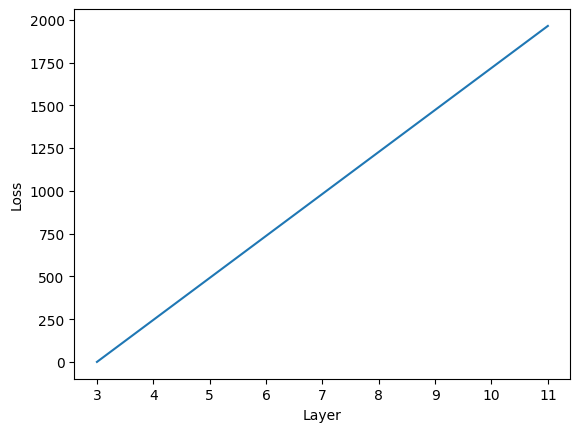

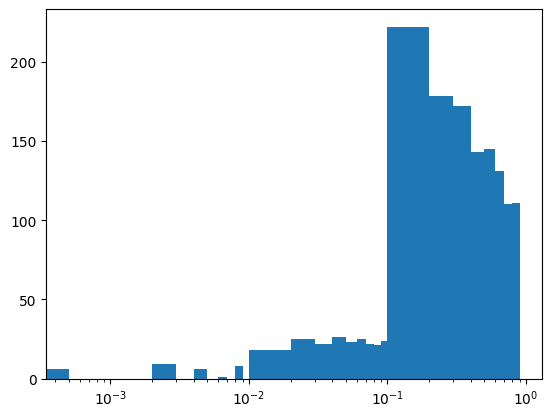

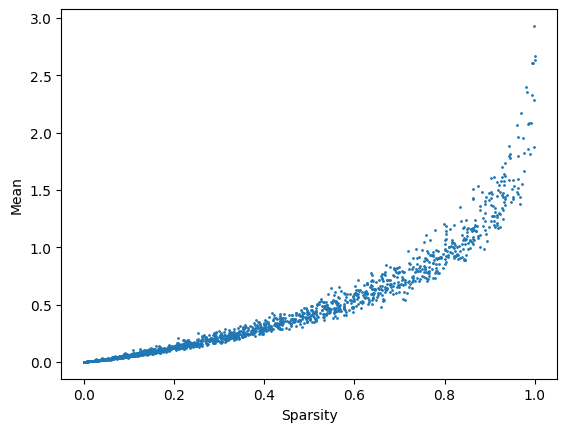

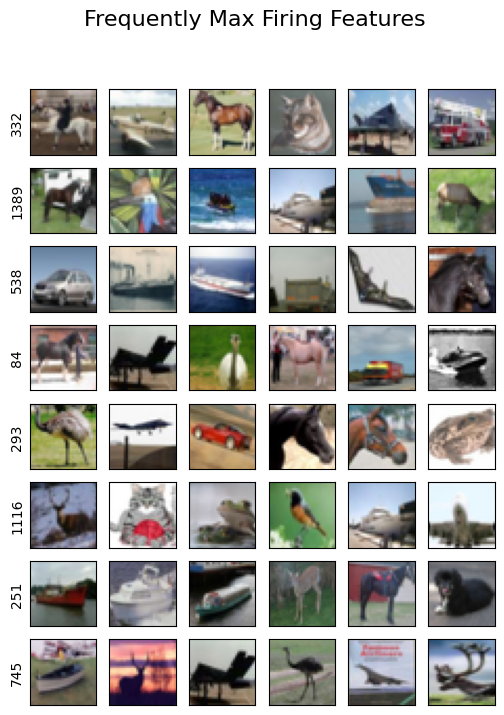

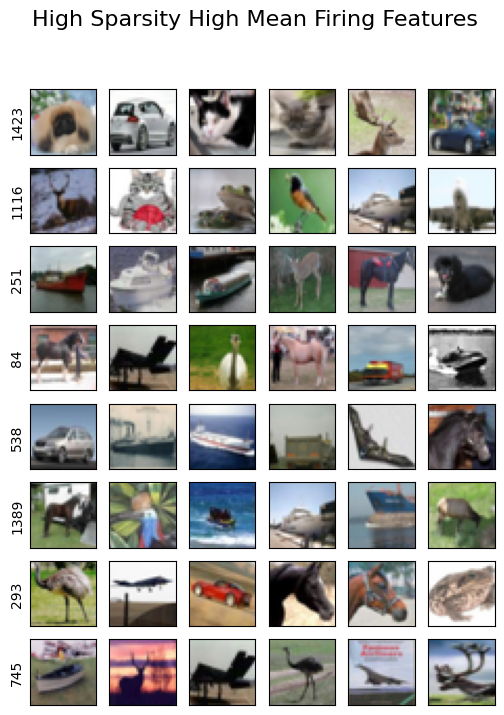

...

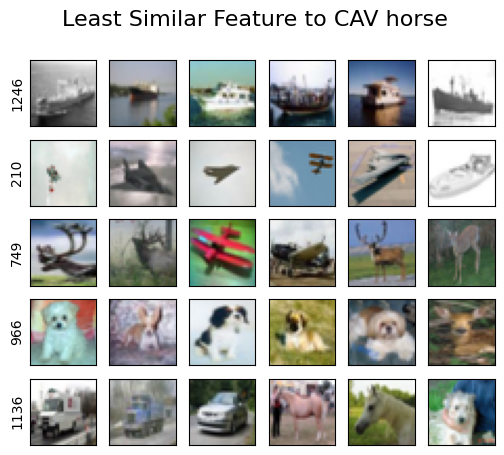

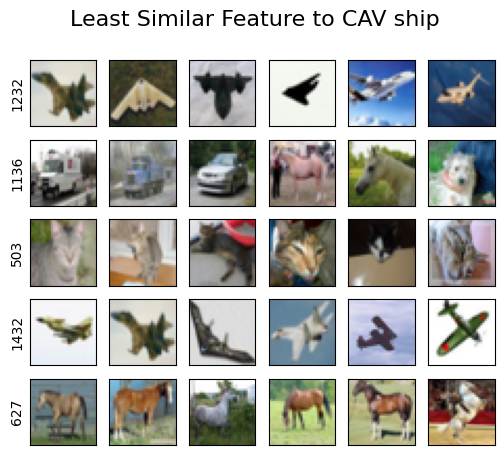

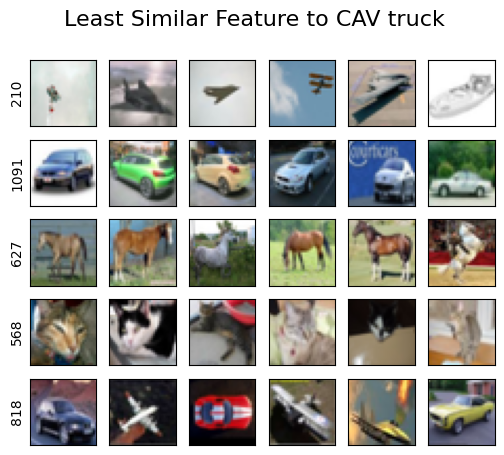

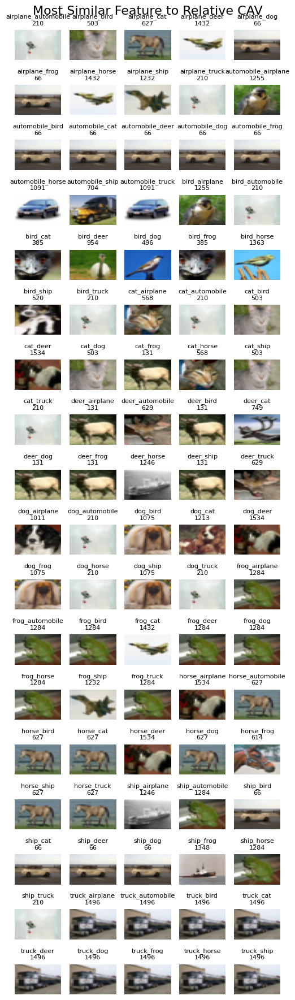

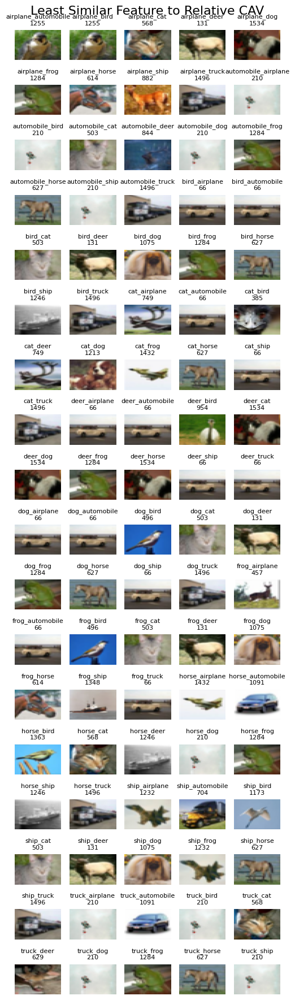

In [20]:
configuration_num=16
layers_to_consider=[3,11]
if not (os.path.exists(f'features/configuration_{configuration_num}')):
        os.mkdir(f'features/configuration_{configuration_num}')
configuration_loss_plot(configuration_num)
progress_bar=tqdm(range(13))
for layer in progress_bar:
        if not(layer in layers_to_consider):
                continue
        if not (os.path.exists(f'features/configuration_{configuration_num}/layer{layer}')):
                os.mkdir(f'features/configuration_{configuration_num}/layer{layer}')
        progress_bar.set_description(f'...layer {layer} sparsity plot...')
        feature_sparsity_plot(configuration_num,layer)
        progress_bar.set_description(f'...layer {layer} sparsity mean plot...')
        feature_mean_activation_against_sparsity(configuration_num,layer)
        progress_bar.set_description(f'...layer {layer} frequently max firing features...')
        frequently_max_firing(configuration_num,layer,test_set)
        progress_bar.set_description(f'...layer {layer} high sparsity high mean features...')
        high_sparsity_high_mean(configuration_num,layer,test_set)
        progress_bar.set_description(f'...layer {layer} low sparsity high mean features...')
        low_sparsity_high_mean(configuration_num,layer,test_set)
        progress_bar.set_description(f'...layer {layer} high mean features...')
        high_mean(configuration_num,layer,test_set)
        progress_bar.set_description(f'...layer {layer} similarity to CAVs...')
        similarity_cav_features(configuration_num,layer,test_set)
        progress_bar.set_description(f'...layer {layer} similarity to relative CAVs...')
        similarity_relcav_features(configuration_num,layer,test_set)